In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, roc_curve, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score
from matplotlib.legend_handler import HandlerLine2D
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix
import pandas_profiling

In C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.

In [2]:
data = pd.read_csv("../data/KPDRs_202011180830.csv", sep="|")
data.loc[data['percentKPDR']<=85, 'Estado'] = 'OK' 
data.loc[(data['percentKPDR']>85) & (data['percentKPDR']<=90), 'Estado'] = 'WARNING'
data.loc[data['percentKPDR']>90, 'Estado'] = 'ERROR' 
data.head()

,date,numDC_SDP,numDC_AIR,numDC_CCN,numDC_OCC,numCDR_CONFB,numCDR_CONFNB,numCDR_CALLB,numCDR_CALLNB,numCDR_DATOSB,TPS_Voice,TPS_SMS,TPS_CCNGY_SSU,TPS_OCCGY_SSU,TPS_OCCGY_CR,TPS_CCNGY_CR,percentKPDR,Estado
0,2020-04-01,14161,4243,52532,7360,4040917,63984419,28433854,6811561,194660821,239041.400000,29518.420000,3.575887e+06,683569.826667,686378.656667,3.725133e+06,79.34,OK
1,2020-04-02,10574,4140,52721,7341,3305776,63328979,28508879,6689355,195071691,238645.593333,31343.580000,3.572376e+06,674990.130000,677777.256667,3.718957e+06,79.30,OK
2,2020-04-03,10569,4237,53089,7380,3341620,66113477,28965949,6761676,195942549,241237.903333,31371.573333,3.587192e+06,679681.506667,682648.070000,3.729649e+06,80.18,OK
3,2020-04-04,10606,4257,51546,7306,3191179,73612433,28296646,6473602,190947487,227801.903333,31313.696667,3.512402e+06,674399.726667,677520.716667,3.646235e+06,79.47,OK
4,2020-04-05,10597,3745,50134,7105,2616808,72131779,25402048,5863993,183873713,199701.533333,30047.836667,3.437706e+06,666307.100000,669164.120000,3.577429e+06,76.46,OK


In [3]:
dataAntigua = data[data['date']<='2020-10-31']
dataAntigua.tail()

,date,numDC_SDP,numDC_AIR,numDC_CCN,numDC_OCC,numCDR_CONFB,numCDR_CONFNB,numCDR_CALLB,numCDR_CALLNB,numCDR_DATOSB,TPS_Voice,TPS_SMS,TPS_CCNGY_SSU,TPS_OCCGY_SSU,TPS_OCCGY_CR,TPS_CCNGY_CR,percentKPDR,Estado
209,2020-10-27,11159,4822,34887,19525,4925028,78817309,38755849,7705452,184821365,301677.713333,26820.530000,2.454138e+06,1.581382e+06,1.591777e+06,2.581541e+06,91.29,ERROR
210,2020-10-28,10954,4755,34803,19629,3964631,71964617,38634326,7500800,183658645,299805.736667,27102.753333,2.445385e+06,1.589553e+06,1.599452e+06,2.570121e+06,90.14,ERROR
211,2020-10-29,10964,4808,34715,19582,3995613,73594474,39122536,7201482,183164716,303930.376667,26924.496667,2.449835e+06,1.591896e+06,1.602344e+06,2.571330e+06,90.18,ERROR
212,2020-10-30,10908,4826,34298,19574,3953046,72855536,40399401,8371354,182589886,317773.913333,26523.060000,2.439676e+06,1.593849e+06,1.608167e+06,2.564460e+06,90.22,ERROR
213,2020-10-31,10970,5463,34981,20219,4693443,72542360,40898718,7748952,188909545,324903.653333,25778.626667,2.477592e+06,1.644657e+06,1.655275e+06,2.597136e+06,91.83,ERROR


In [4]:
profile = pandas_profiling.ProfileReport(dataAntigua)
profile.to_file("../data/pofiling.html")
profile

C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\pandas\core\frame.py:4303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [5]:
varIndep = dataAntigua[['numDC_SDP' ,'numDC_AIR' ,'numDC_CCN' ,'numDC_OCC' ,'numCDR_CONFB' ,'numCDR_CONFNB' ,'numCDR_CALLB' ,'numCDR_CALLNB' ,'numCDR_DATOSB' ,'TPS_Voice' ,'TPS_SMS' ,'TPS_CCNGY_SSU' ,'TPS_OCCGY_SSU' ,'TPS_OCCGY_CR' ,'TPS_CCNGY_CR']].values
varDep = dataAntigua[['Estado']].values

X_train, X_test, y_train, y_test = train_test_split(varIndep
                                                    , varDep
                                                    , test_size=0.20
                                                    , random_state=20201116
                                                    , stratify=varDep)

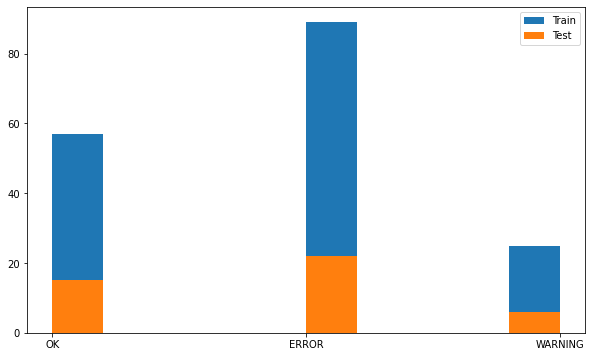

In [6]:
plt.figure(figsize=(10,6))
plt.hist(y_train, label="Train")
plt.hist(y_test, label="Test")
plt.legend()

In [7]:
logreg = LogisticRegression(class_weight='balanced')
logreg.fit(X_train, y_train.ravel())

C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(class_weight='balanced')

Text(0.5, 1.0, 'Logistic Regression')

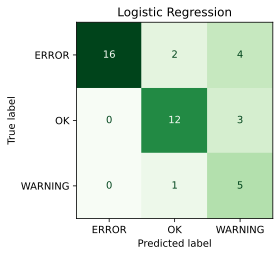

In [8]:
%config InlineBackend.figure_format = 'svg'

fig = plt.figure(figsize=(15,15))

ax1 = fig.add_subplot(1,3,1)
plot_confusion_matrix(logreg, X_test, y_test, cmap = 'Greens', ax=ax1).im_.colorbar.remove()
plt.title("Logistic Regression")

In [9]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000] # n_estimators is the number of trees to be used in the fores
}

model_rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator = model_rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(X_train, y_train)
rfc_pred = grid_search.predict(X_test)
rfc_pred

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed:  3.1min finished
C:\Jairo.Ordonez\2. Personal\Data Science Program\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:765: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


array(['ERROR', 'OK', 'ERROR', 'OK', 'OK', 'WARNING', 'ERROR', 'OK',
       'ERROR', 'WARNING', 'ERROR', 'ERROR', 'ERROR', 'ERROR', 'ERROR',
       'ERROR', 'ERROR', 'OK', 'OK', 'OK', 'OK', 'ERROR', 'ERROR',
       'ERROR', 'OK', 'OK', 'WARNING', 'ERROR', 'ERROR', 'ERROR',
       'WARNING', 'ERROR', 'OK', 'ERROR', 'OK', 'OK', 'WARNING', 'ERROR',
       'ERROR', 'ERROR', 'OK', 'ERROR', 'OK'], dtype=object)

In [10]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 90,
 'max_features': 2,
 'min_samples_leaf': 3,
 'min_samples_split': 10,
 'n_estimators': 200}

In [20]:
ranf = RandomForestClassifier(bootstrap=True,
                              max_depth=90,
                              max_features=2,
                              min_samples_leaf=3,
                              min_samples_split=10,
                              n_estimators=200)
ranf.fit(X_train, y_train.ravel())

rfc_pred = ranf.predict(X_test)

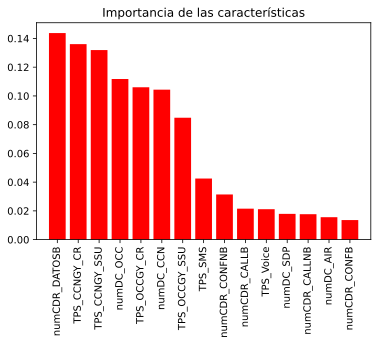

In [21]:
importances = ranf.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure()
plt.title("Importancia de las características")
plt.bar(range(X_train.shape[1]), importances[indices],
       color="r", align="center")
xticks_labels = [dataAntigua.columns[1+i] for i in indices]
plt.xticks(range(varIndep.shape[1]), xticks_labels, rotation=90)
plt.xlim([-1, varIndep.shape[1]])
plt.show()

In [22]:
cm_rf = confusion_matrix(y_test,rfc_pred)
print('Confusion Matrix : \n', cm_rf)

total1=sum(sum(cm_rf))
#####from confusion matrix calculate accuracy
accuracy1=(cm_rf[0,0]+cm_rf[1,1]+cm_rf[2,2])/total1
print ('Accuracy : ', accuracy1)

Confusion Matrix : 
 [[20  0  2]
 [ 0 15  0]
 [ 1  1  4]]
Accuracy :  0.9069767441860465


Text(0.5, 1.0, 'Random Forest')

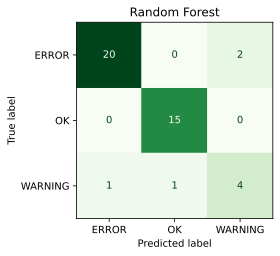

In [23]:
%config InlineBackend.figure_format = 'svg'

fig = plt.figure(figsize=(15,15))

ax1 = fig.add_subplot(1,3,1)
plot_confusion_matrix(ranf, X_test, y_test, cmap = 'Greens', ax=ax1).im_.colorbar.remove()
plt.title("Random Forest")

In [24]:
y_pred_logreg = logreg.predict(X_test)
y_pred_ranFor = rfc_pred
metricas = [accuracy_score, precision_score, recall_score]

for metrica in metricas:
    print(metrica.__name__)
    if metrica.__name__ in ["accuracy_score"]:
        print(f"Regresión Logística: {metrica(y_test, y_pred_logreg):>.2f}")
        print(f"Random Forest: {metrica(y_test, y_pred_ranFor):>.2f}")
    else:
        print(f"Regresión Logística: {metrica(y_test, y_pred_logreg, average='weighted'):>.2f}")
        print(f"Random Forest: {metrica(y_test, y_pred_ranFor, average='weighted'):>.2f}")
    print()

accuracy_score
Regresión Logística: 0.77
Random Forest: 0.91

precision_score
Regresión Logística: 0.85
Random Forest: 0.91

recall_score
Regresión Logística: 0.77
Random Forest: 0.91



In [25]:
import pickle

with open('modeloRandomForest.pkl', 'wb') as f:
    pickle.dump(ranf, f)

In [26]:
with open('modeloRandomForest.pkl', 'rb') as f:
    modeloCargado = pickle.load(f)

Text(0.5, 1.0, 'Random Forest')

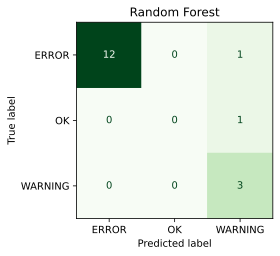

In [27]:
dataNueva = data[data['date']>'2020-10-31']
nuevosX = dataNueva[['numDC_SDP' ,'numDC_AIR' ,'numDC_CCN' ,'numDC_OCC' ,'numCDR_CONFB' ,'numCDR_CONFNB' ,'numCDR_CALLB' ,'numCDR_CALLNB' ,'numCDR_DATOSB' ,'TPS_Voice' ,'TPS_SMS' ,'TPS_CCNGY_SSU' ,'TPS_OCCGY_SSU' ,'TPS_OCCGY_CR' ,'TPS_CCNGY_CR']].values
nuevosY = dataNueva[['Estado']].values

predictNuevos = modeloCargado.predict(nuevosX)

%config InlineBackend.figure_format = 'svg'

fig = plt.figure(figsize=(15,15))

ax1 = fig.add_subplot(1,3,1)
plot_confusion_matrix(modeloCargado, nuevosX, nuevosY, cmap = 'Greens', ax=ax1).im_.colorbar.remove()
plt.title("Random Forest")

In [28]:
cm_rf = confusion_matrix(nuevosY,predictNuevos)
print('Confusion Matrix : \n', cm_rf)

total1=sum(sum(cm_rf))
#####from confusion matrix calculate accuracy
accuracy1=(cm_rf[0,0]+cm_rf[1,1]+cm_rf[2,2])/total1
print ('Accuracy : ', accuracy1)

Confusion Matrix : 
 [[12  0  1]
 [ 0  0  1]
 [ 0  0  3]]
Accuracy :  0.8823529411764706
